In [4]:
import cv2
from matplotlib import pyplot as plt


In [5]:
def display_image(img, title="Image", cmap=None):
    plt.figure(figsize=(10, 8))
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [6]:
image_path1 = "data/images/cars.jpg"
image_path2 = "data/images/humans.jpg"


In [7]:
image1 = cv2.imread(image_path1)
image2 = cv2.imread(image_path2)


In [8]:
image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2_rgb = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)


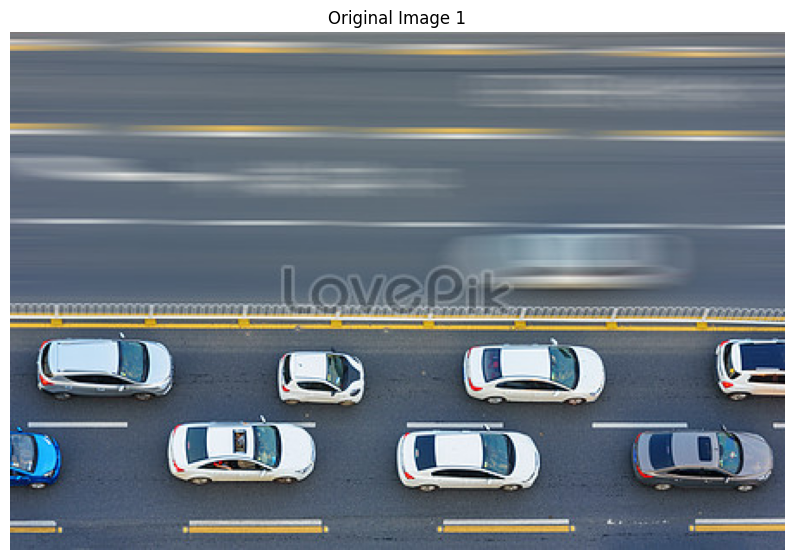

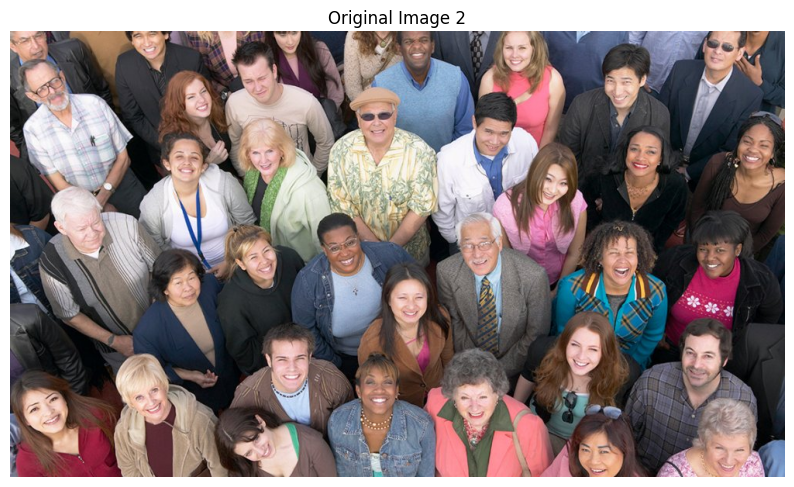

In [9]:
display_image(image1_rgb, "Original Image 1")
display_image(image2_rgb, "Original Image 2")

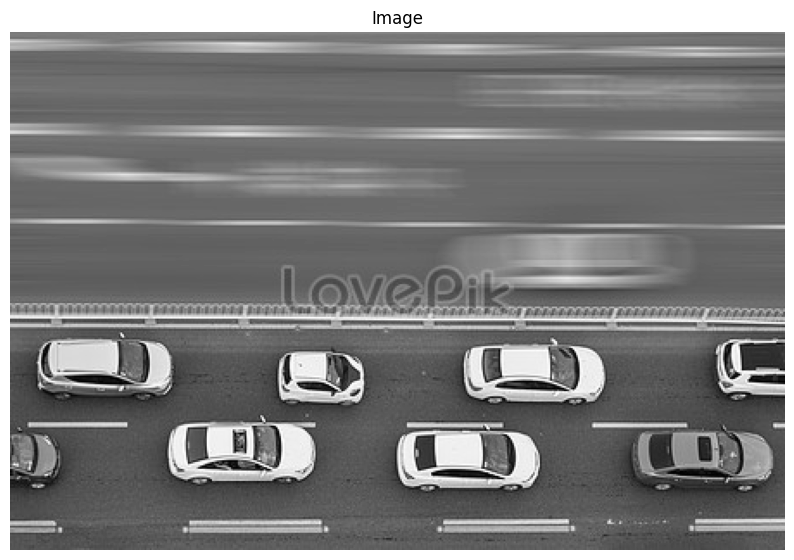

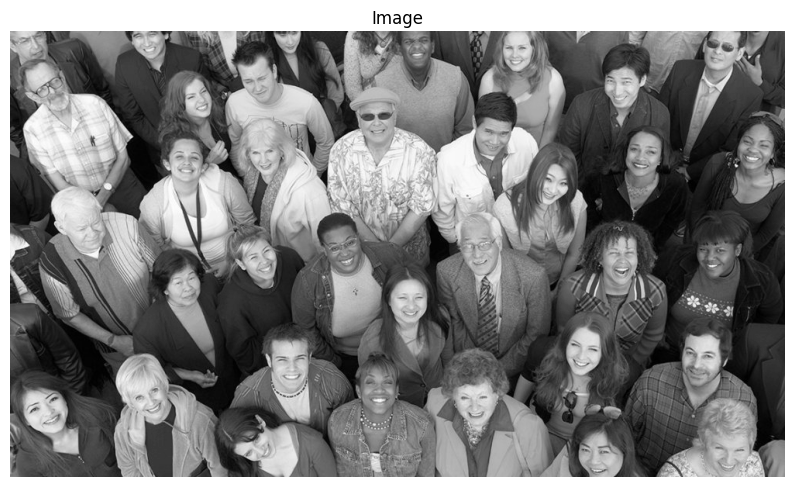

In [12]:

image_bgr1 = cv2.cvtColor(image1_rgb, cv2.COLOR_RGB2BGR)
image_bgr2 = cv2.cvtColor(image2_rgb, cv2.COLOR_RGB2BGR )

image_gray1 = cv2.cvtColor(image_bgr1, cv2.COLOR_BGR2GRAY)
image_gray2 = cv2.cvtColor(image_bgr2, cv2.COLOR_BGR2GRAY)

display_image(image_gray1, cmap='gray')
display_image(image_gray2, cmap='gray')



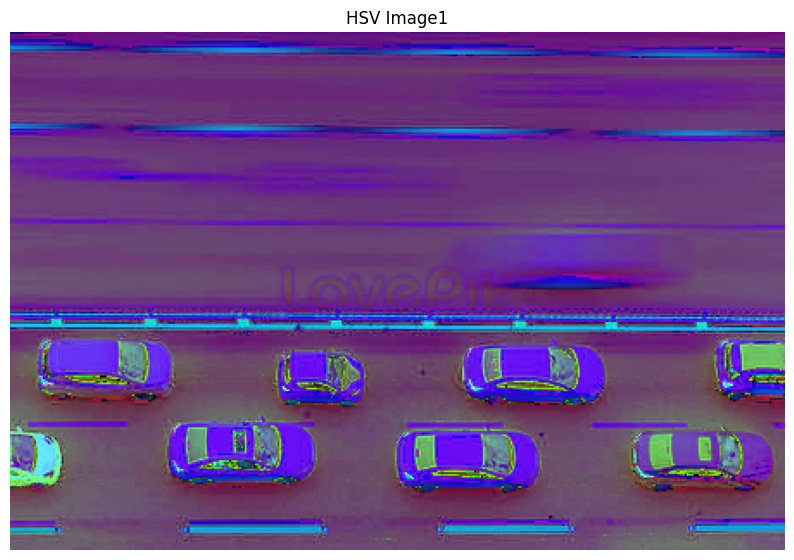

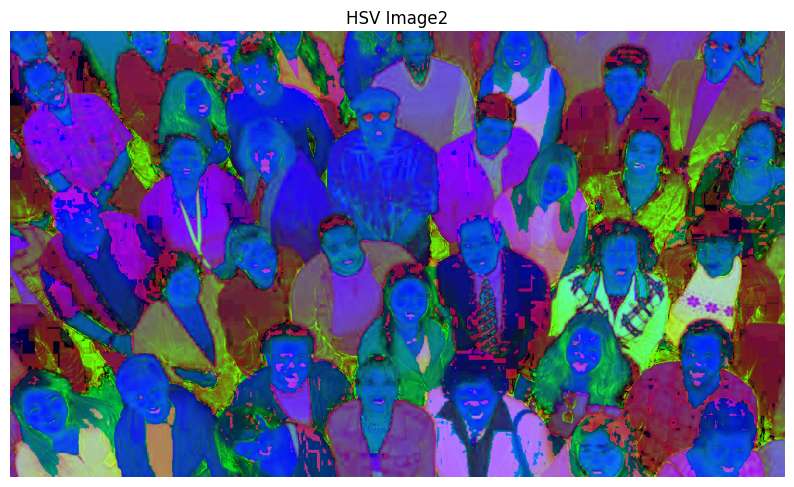

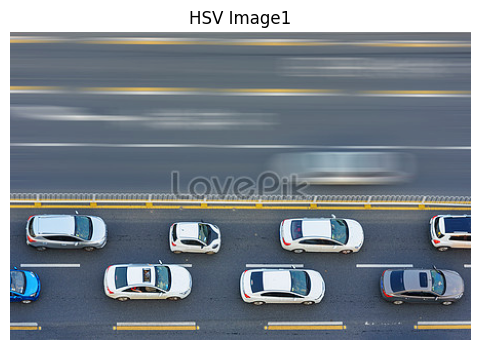

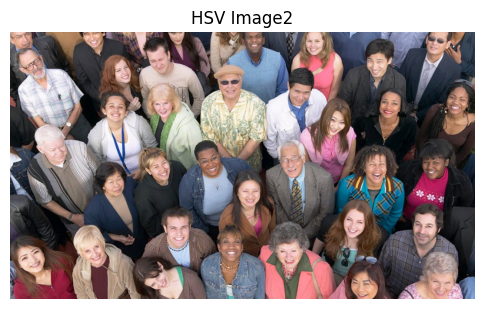

In [14]:
image1_hsv = cv2.cvtColor(image_bgr1, cv2.COLOR_BGR2HSV)
image2_hsv = cv2.cvtColor(image_bgr2, cv2.COLOR_BGR2HSV)

def display_image_converting_to_rgb(image, title='Image', cmap=None):
    # Convert HSV image back to RGB for displaying using matplotlib
    if cmap is None:
        image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    plt.figure(figsize=(6, 4))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.show()

display_image(image1_hsv, 'HSV Image1')
display_image(image2_hsv, 'HSV Image2')

display_image_converting_to_rgb(image1_hsv, 'HSV Image1')
display_image_converting_to_rgb(image2_hsv, 'HSV Image2')


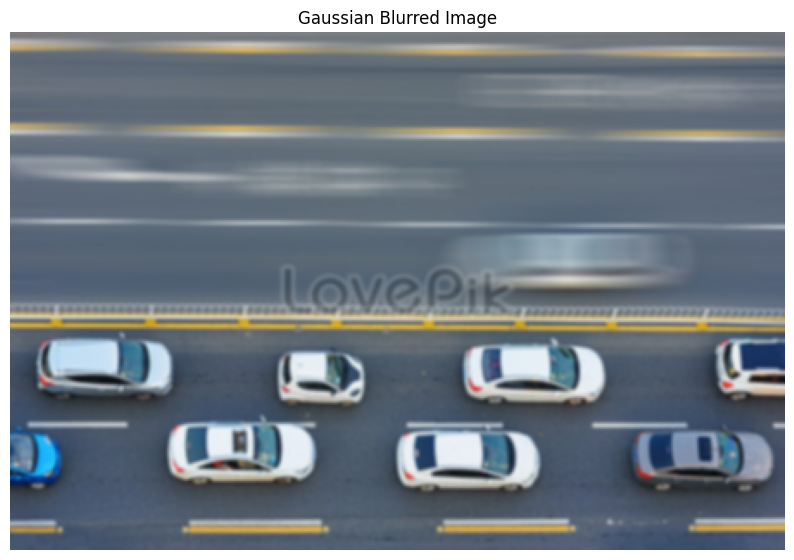

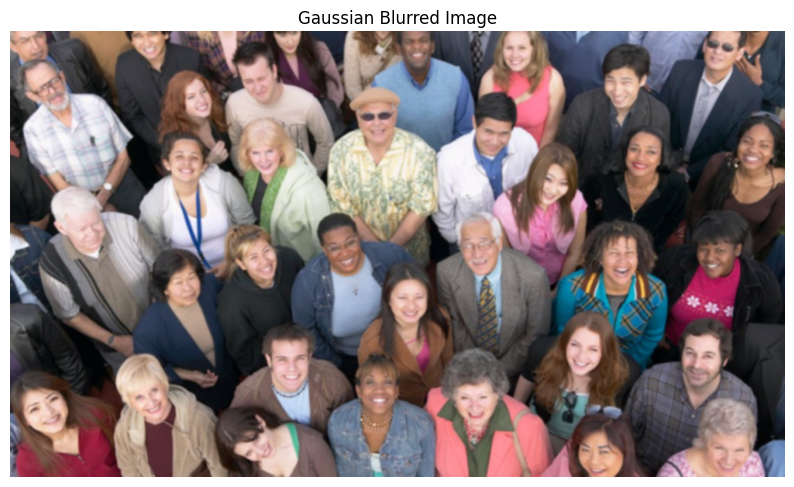

In [15]:

# Apply Gaussian Blur to the image
blurred_image1 = cv2.GaussianBlur(image_bgr1, (5, 5), 0)

blurred_image2 = cv2.GaussianBlur(image_bgr2, (5, 5), 0)

# Convert the blurred image back to RGB for displaying
blurred_image_rgb1 = cv2.cvtColor(blurred_image1, cv2.COLOR_BGR2RGB)

blurred_image_rgb2 = cv2.cvtColor(blurred_image2, cv2.COLOR_BGR2RGB)

# Display the blurred image
display_image(blurred_image_rgb1, 'Gaussian Blurred Image')

display_image(blurred_image_rgb2, 'Gaussian Blurred Image')

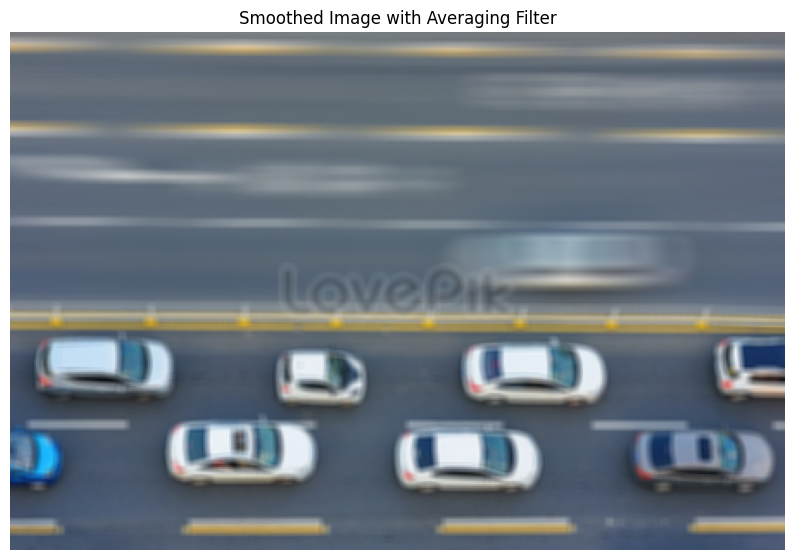

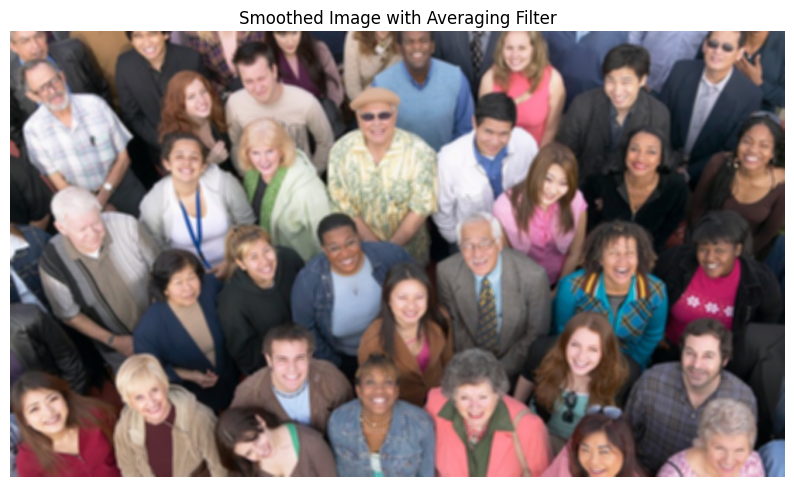

In [17]:
import numpy as np
kernel_size = 5

# Create an averaging filter kernel
# The kernel elements are all equal and sum up to 1 for averaging
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)

smoothed_image1 = cv2.filter2D(image_bgr1, -1, kernel)
smoothed_image2 = cv2.filter2D(image_bgr2, -1, kernel)

smoothed_image_rgb1 = cv2.cvtColor(smoothed_image1, cv2.COLOR_BGR2RGB)
smoothed_image_rgb2 = cv2.cvtColor(smoothed_image2, cv2.COLOR_BGR2RGB)

display_image(smoothed_image_rgb1, 'Smoothed Image with Averaging Filter')
display_image(smoothed_image_rgb2, 'Smoothed Image with Averaging Filter')

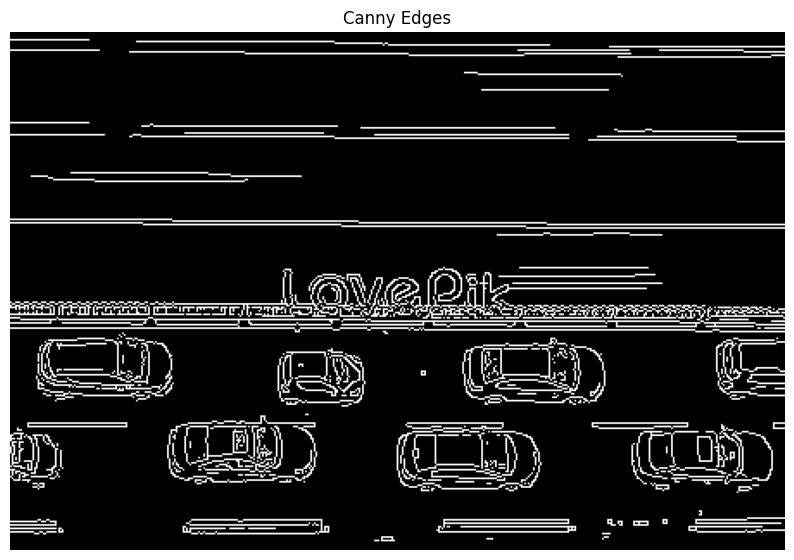

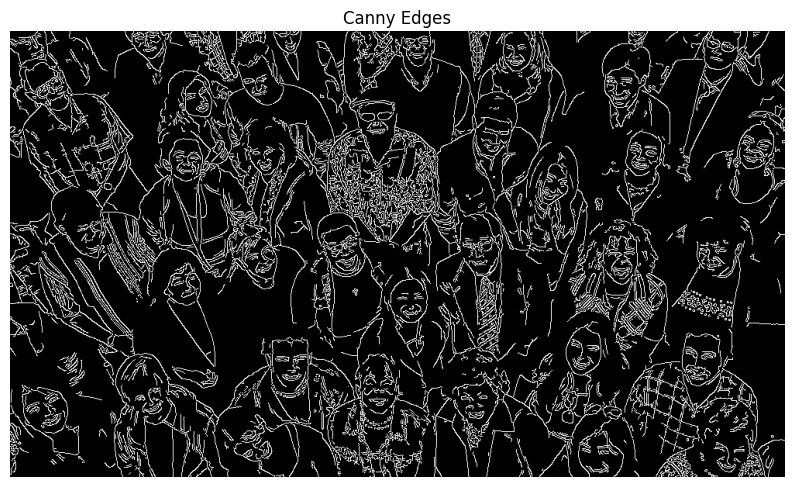

In [18]:
edges1 = cv2.Canny(image_gray1, threshold1=100, threshold2=200)
edges2 = cv2.Canny(image_gray2, threshold1=100, threshold2=200)

display_image(edges1, 'Canny Edges', cmap='gray')
display_image(edges2, 'Canny Edges', cmap='gray')

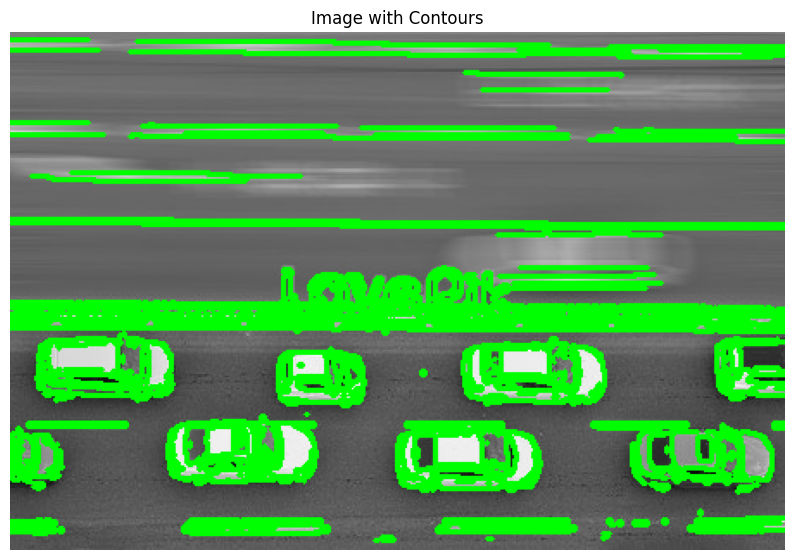

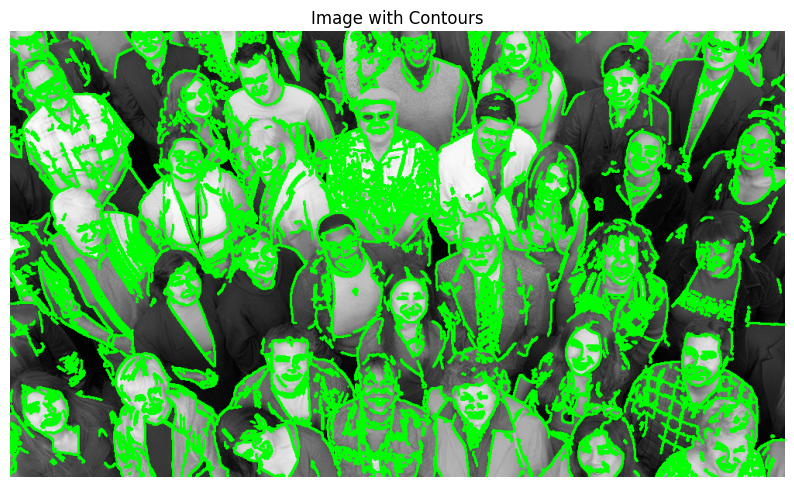

In [19]:
contours1, _ = cv2.findContours(edges1, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
contours2, _ = cv2.findContours(edges2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

image_contours1 = cv2.cvtColor(image_gray1, cv2.COLOR_GRAY2RGB)
image_contours2 = cv2.cvtColor(image_gray2, cv2.COLOR_GRAY2RGB)

cv2.drawContours(image_contours1, contours1, -1, (0, 255, 0), 2)
cv2.drawContours(image_contours2, contours2, -1, (0, 255, 0), 2)

display_image(image_contours1, 'Image with Contours')
display_image(image_contours2, 'Image with Contours')

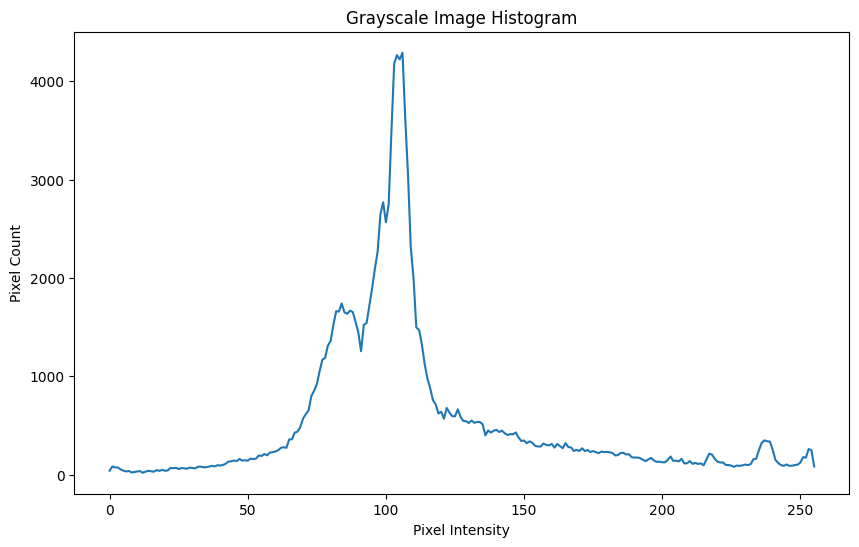

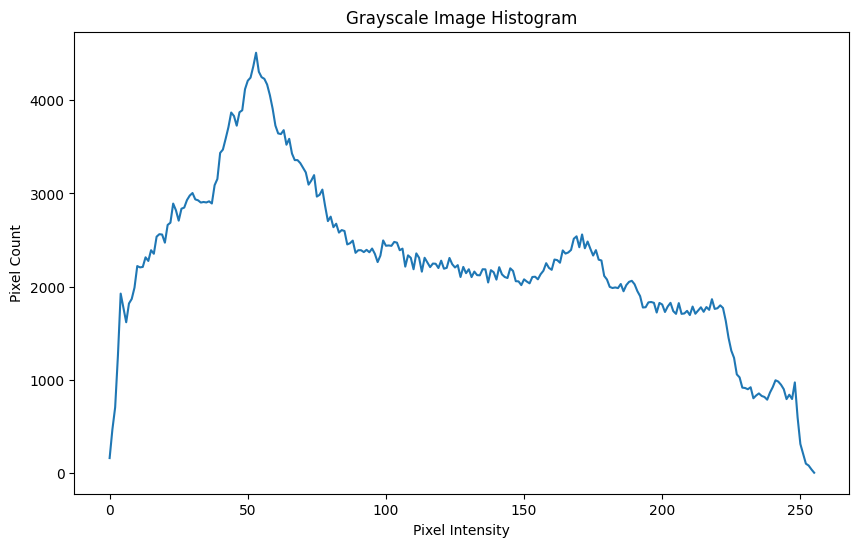

In [20]:
hist1 = cv2.calcHist([image_gray1], [0], None, [256], [0, 256])
hist2 = cv2.calcHist([image_gray2], [0], None, [256], [0, 256])

def plot_hist(hist):
    plt.figure(figsize=(10, 6))
    plt.plot(hist)
    plt.title('Grayscale Image Histogram')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Pixel Count')
    plt.show()

plot_hist(hist1)
plot_hist(hist2)

In [43]:
import torch
from PIL import Image,ImageDraw

model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)


Using cache found in /home/k4czyns/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-2-12 Python-3.12.1 torch-2.2.0+cu121 CUDA:0 (NVIDIA GeForce 940MX, 2003MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


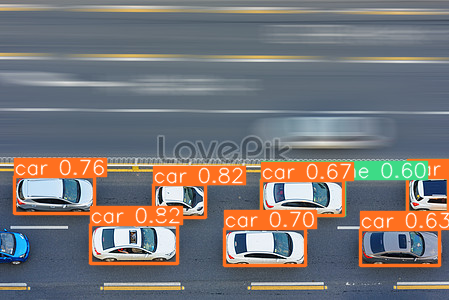

In [42]:
image1 = Image.open(image_path1)
image2 = Image.open(image_path2)

results1 = model(image1)

results1.show()



In [47]:
from facenet_pytorch import MTCNN
from IPython.display import display

mtcnn = MTCNN(keep_all=True, device=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))



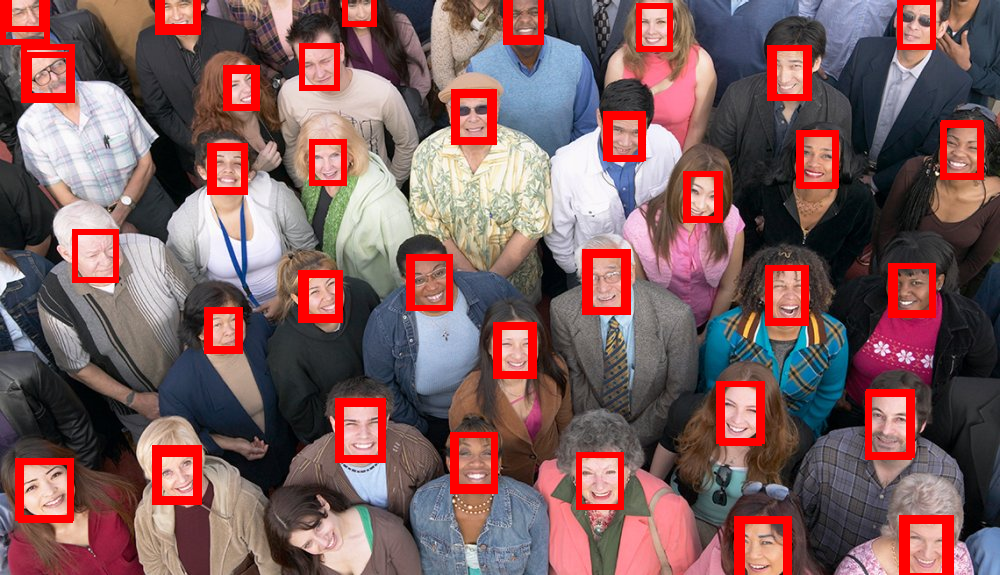

In [48]:
boxes, _ = mtcnn.detect(image2)

draw = ImageDraw.Draw(image2)
for box in boxes:
    draw.rectangle(box.tolist(), outline=(255, 0, 0), width=6)

display(image2)